# Generative AI: Stable Diffusion Models


# Text-to-image

When you think of diffusion models, text-to-image is usually one of the first things that come to mind. Text-to-image generates an image from a text description (for example, "Astronaut in a jungle, cold color palette, muted colors, detailed, 8k") which is also known as a *prompt*.

From a very high level, a diffusion model takes a prompt and some random initial noise, and iteratively removes the noise to construct an image. The *denoising* process is guided by the prompt, and once the denoising process ends after a predetermined number of time steps, the image representation is decoded into an image.

<Tip>

Read the [How does Stable Diffusion work?](https://huggingface.co/blog/stable_diffusion#how-does-stable-diffusion-work) blog post to learn more about how a latent diffusion model works.

</Tip>

You can generate images from a prompt in 🤗 Diffusers in two steps:

1. Load a checkpoint into the [AutoPipelineForText2Image](https://huggingface.co/docs/diffusers/main/en/api/pipelines/auto_pipeline#diffusers.AutoPipelineForText2Image) class, which automatically detects the appropriate pipeline class to use based on the checkpoint:

In [1]:
from diffusers import AutoPipelineForText2Image
import torch

pipeline = AutoPipelineForText2Image.from_pretrained(
	"stable-diffusion-v1-5/stable-diffusion-v1-5", torch_dtype=torch.float16, variant="fp16"
).to("cuda")

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

config.json: 0.00B [00:00, ?B/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

safety_checker/model.fp16.safetensors:   0%|          | 0.00/608M [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

text_encoder/model.fp16.safetensors:   0%|          | 0.00/246M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

vae/diffusion_pytorch_model.fp16.safeten(…):   0%|          | 0.00/167M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

unet/diffusion_pytorch_model.fp16.safete(…):   0%|          | 0.00/1.72G [00:00<?, ?B/s]

config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`torch_dtype` is deprecated! Use `dtype` instead!


2. Pass a prompt to the pipeline to generate an image:

  0%|          | 0/50 [00:00<?, ?it/s]

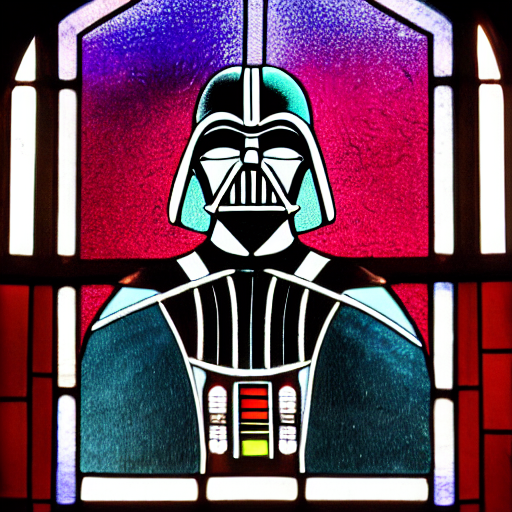

In [2]:
generator = torch.manual_seed(42)  # change 42 to any seed you want
image = pipeline(
    "stained glass of darth vader, backlight, centered composition, masterpiece, photorealistic, 8k",
    num_inference_steps=50,       # number of denoising steps
    generator=generator           # seed
).images[0]
image

<div class="flex justify-center">
	<img src="https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/text2img-vader.png"/>
</div>

## Popular models

The most common text-to-image models are [Stable Diffusion v1.5](https://huggingface.co/stable-diffusion-v1-5/stable-diffusion-v1-5), [Stable Diffusion XL (SDXL)](https://huggingface.co/stabilityai/stable-diffusion-xl-base-1.0), and [Kandinsky 2.2](https://huggingface.co/kandinsky-community/kandinsky-2-2-decoder). There are also ControlNet models or adapters that can be used with text-to-image models for more direct control in generating images. The results from each model are slightly different because of their architecture and training process, but no matter which model you choose, their usage is more or less the same. Let's use the same prompt for each model and compare their results.

### Stable Diffusion v1.5

[Stable Diffusion v1.5](https://huggingface.co/stable-diffusion-v1-5/stable-diffusion-v1-5) is a latent diffusion model initialized from [Stable Diffusion v1-4](https://huggingface.co/CompVis/stable-diffusion-v1-4), and finetuned for 595K steps on 512x512 images from the LAION-Aesthetics V2 dataset. You can use this model like:

In [3]:
from diffusers import AutoPipelineForText2Image
import torch

pipeline = AutoPipelineForText2Image.from_pretrained(
	"stable-diffusion-v1-5/stable-diffusion-v1-5", torch_dtype=torch.float16, variant="fp16"
).to("cuda")


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

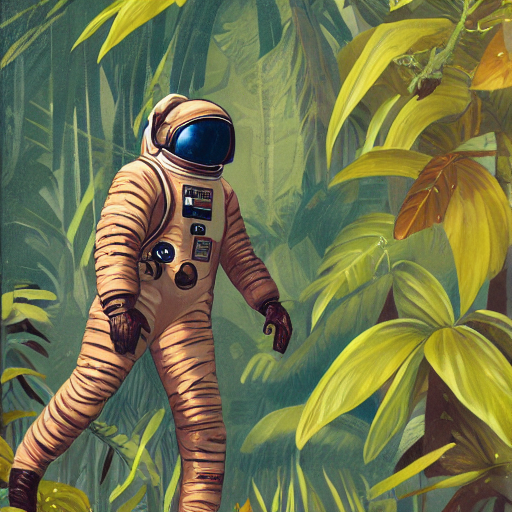

In [4]:
generator = torch.Generator("cuda").manual_seed(31)
image = pipeline("Astronaut in a jungle, cold color palette, muted colors, detailed, 8k", generator=generator).images[0]
image

### Stable Diffusion XL

SDXL is a much larger version of the previous Stable Diffusion models, and involves a two-stage model process that adds even more details to an image. It also includes some additional *micro-conditionings* to generate high-quality images centered subjects. Take a look at the more comprehensive [SDXL](https://huggingface.co/docs/diffusers/main/en/using-diffusers/sdxl) guide to learn more about how to use it. In general, you can use SDXL like:

In [5]:
from diffusers import AutoPipelineForText2Image
import torch

pipeline = AutoPipelineForText2Image.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0", torch_dtype=torch.float16, variant="fp16"
).to("cuda")

model_index.json:   0%|          | 0.00/609 [00:00<?, ?B/s]

Fetching 19 files:   0%|          | 0/19 [00:00<?, ?it/s]

text_encoder_2/model.fp16.safetensors:   0%|          | 0.00/1.39G [00:00<?, ?B/s]

text_encoder/model.fp16.safetensors:   0%|          | 0.00/246M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/737 [00:00<?, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/575 [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/479 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/565 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

unet/diffusion_pytorch_model.fp16.safete(…):   0%|          | 0.00/5.14G [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/725 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/642 [00:00<?, ?B/s]

vae/diffusion_pytorch_model.fp16.safeten(…):   0%|          | 0.00/167M [00:00<?, ?B/s]

vae_1_0/diffusion_pytorch_model.fp16.saf(…):   0%|          | 0.00/167M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

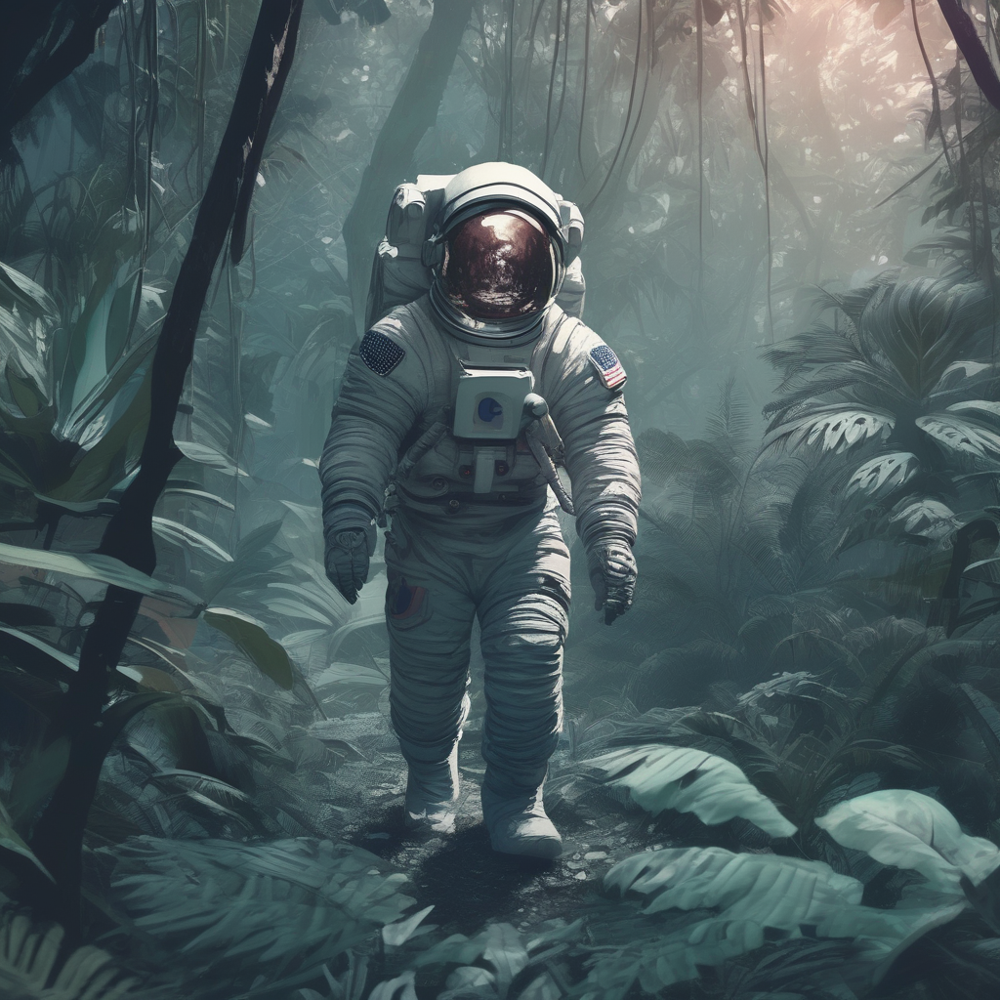

In [6]:
generator = torch.Generator("cuda").manual_seed(31)
image = pipeline("Astronaut in a jungle, cold color palette, muted colors, detailed, 8k", generator=generator).images[0]
image

In [7]:
import gc
import torch

# Delete the old pipeline object
del pipeline
gc.collect()

# Clear CUDA memory
torch.cuda.empty_cache()

### Kandinsky 2.2

The Kandinsky model is a bit different from the Stable Diffusion models because it also uses an image prior model to create embeddings that are used to better align text and images in the diffusion model.

The easiest way to use Kandinsky 2.2 is:

model_index.json:   0%|          | 0.00/250 [00:00<?, ?B/s]

Fetching 7 files:   0%|          | 0/7 [00:00<?, ?it/s]

README.md: 0.00B [00:00, ?B/s]

config.json: 0.00B [00:00, ?B/s]

unet/diffusion_pytorch_model.safetensors:   0%|          | 0.00/5.01G [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/317 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/660 [00:00<?, ?B/s]

movq/diffusion_pytorch_model.safetensors:   0%|          | 0.00/271M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/3 [00:00<?, ?it/s]

model_index.json:   0%|          | 0.00/501 [00:00<?, ?B/s]

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

config.json: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/252 [00:00<?, ?B/s]

image_encoder/model.safetensors:   0%|          | 0.00/3.69G [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/315 [00:00<?, ?B/s]

text_encoder/model.safetensors:   0%|          | 0.00/2.78G [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

prior/diffusion_pytorch_model.safetensor(…):   0%|          | 0.00/4.10G [00:00<?, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer_config.json:   0%|          | 0.00/904 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/229 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

/usr/local/lib/python3.12/dist-packages/diffusers/pipelines/kandinsky2_2/pipeline_kandinsky2_2.py:210: FutureWarning: `callback_steps` is deprecated and will be removed in version 1.0.0. Passing `callback_steps` as an input argument to `__call__` is deprecated, consider use `callback_on_step_end`
  deprecate(


  0%|          | 0/100 [00:00<?, ?it/s]

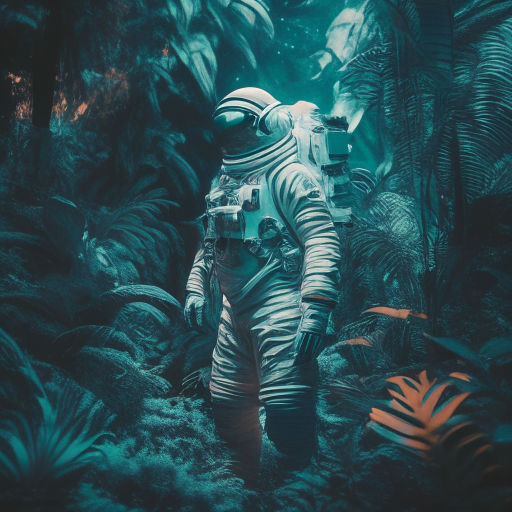

In [8]:
from diffusers import AutoPipelineForText2Image
import torch

pipeline = AutoPipelineForText2Image.from_pretrained(
	"kandinsky-community/kandinsky-2-2-decoder", torch_dtype=torch.float16
).to("cuda")
generator = torch.Generator("cuda").manual_seed(31)
image = pipeline("Astronaut in a jungle, cold color palette, muted colors, detailed, 8k", generator=generator).images[0]
image

### ControlNet

ControlNet models are auxiliary models or adapters that are finetuned on top of text-to-image models, such as [Stable Diffusion v1.5](https://huggingface.co/stable-diffusion-v1-5/stable-diffusion-v1-5). Using ControlNet models in combination with text-to-image models offers diverse options for more explicit control over how to generate an image. With ControlNet, you add an additional conditioning input image to the model. For example, if you provide an image of a human pose (usually represented as multiple keypoints that are connected into a skeleton) as a conditioning input, the model generates an image that follows the pose of the image. Check out the more in-depth [ControlNet](https://huggingface.co/docs/diffusers/main/en/using-diffusers/controlnet) guide to learn more about other conditioning inputs and how to use them.

In this example, let's condition the ControlNet with a human pose estimation image. Load the ControlNet model pretrained on human pose estimations:

In [15]:
import gc
import torch

# Delete the old pipeline object
del pipeline
gc.collect()

# Clear CUDA memory
torch.cuda.empty_cache()

In [11]:
from diffusers import ControlNetModel, AutoPipelineForText2Image
from diffusers.utils import load_image
import torch

controlnet = ControlNetModel.from_pretrained(
	"lllyasviel/control_v11p_sd15_openpose", torch_dtype=torch.float16, variant="fp16"
).to("cuda")
pose_image = load_image("https://huggingface.co/lllyasviel/control_v11p_sd15_openpose/resolve/main/images/control.png")

config.json:   0%|          | 0.00/999 [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/723M [00:00<?, ?B/s]

Pass the `controlnet` to the [AutoPipelineForText2Image](https://huggingface.co/docs/diffusers/main/en/api/pipelines/auto_pipeline#diffusers.AutoPipelineForText2Image), and provide the prompt and pose estimation image:

In [12]:
pipeline = AutoPipelineForText2Image.from_pretrained(
	"stable-diffusion-v1-5/stable-diffusion-v1-5", controlnet=controlnet, torch_dtype=torch.float16, variant="fp16"
).to("cuda")

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

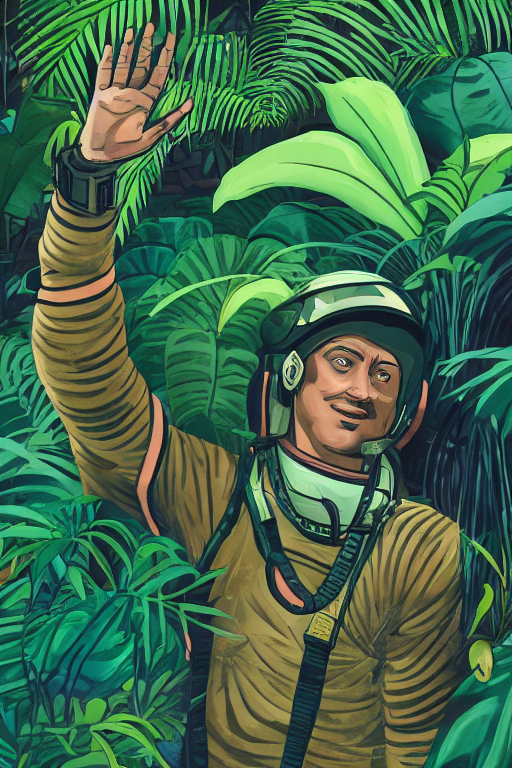

In [13]:
generator = torch.Generator("cuda").manual_seed(31)
image = pipeline("Astronaut in a jungle, cold color palette, muted colors, detailed, 8k", image=pose_image, generator=generator).images[0]
image

<div class="flex flex-row gap-4">
  <div class="flex-1">
    <img class="rounded-xl" src="https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/text2img-1.png"/>
    <figcaption class="mt-2 text-center text-sm text-gray-500">Stable Diffusion v1.5</figcaption>
  </div>
  <div class="flex-1">
    <img class="rounded-xl" src="https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/sdxl-text2img.png"/>
    <figcaption class="mt-2 text-center text-sm text-gray-500">Stable Diffusion XL</figcaption>
  </div>
  <div class="flex-1">
    <img class="rounded-xl" src="https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/text2img-2.png"/>
    <figcaption class="mt-2 text-center text-sm text-gray-500">Kandinsky 2.2</figcaption>
  </div>
  <div class="flex-1">
    <img class="rounded-xl" src="https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/text2img-3.png"/>
    <figcaption class="mt-2 text-center text-sm text-gray-500">ControlNet (pose conditioning)</figcaption>
  </div>
</div>

## Configure pipeline parameters

# 🎛 Stable Diffusion Pipeline Parameters (Diffusers)

| Parameter              | Type / Default          | Description                                                                 |
|------------------------|-------------------------|-----------------------------------------------------------------------------|
| **prompt**             | `str` / *required*      | The text prompt to guide image generation.                                 |
| **negative_prompt**    | `str` / `None`          | Text describing what to avoid (e.g., "blurry, low quality").               |
| **num_inference_steps**| `int` / `50`            | Number of denoising steps (more = better quality, slower).                 |
| **guidance_scale**     | `float` / `7.5`         | Classifier-Free Guidance (CFG) scale. Higher = stricter to prompt.         |
| **generator**          | `torch.Generator` / `None` | Controls randomness via seed: `torch.manual_seed(42)`.                      |
| **num_images_per_prompt** | `int` / `1`          | Number of images generated per prompt.                                     |
| **height**             | `int` / `512`           | Output image height (must be divisible by 8).                              |
| **width**              | `int` / `512`           | Output image width (must be divisible by 8).                               |
| **latents**            | `torch.FloatTensor` / `None` | Precomputed latent noise (for reproducibility or interpolation).          |
| **output_type**        | `str` / `"pil"`         | Format: `"pil"`, `"np"`, or `"latent"`.                                    |
| **callback**           | `Callable` / `None`     | Function called after each step (for custom logging/monitoring).           |
| **callback_steps**     | `int` / `1`             | Frequency (steps) for calling the callback function.                       |

---

## 🖼 Extra Parameters for Img2Img / Inpainting

| Parameter              | Type / Default          | Description                                                                 |
|------------------------|-------------------------|-----------------------------------------------------------------------------|
| **image**              | `PIL.Image` / `None`    | Input image for image-to-image generation.                                 |
| **strength**           | `float` / `0.8`         | How much of the input image to preserve (low = minor edits, high = big changes). |
| **mask_image**         | `PIL.Image` / `None`    | Mask for inpainting (white = modify, black = keep).                        |

---

## ⚙️ Notes
- `height` × `width` greatly affects VRAM usage (1024×1024 can be heavy on GPUs).  
- `guidance_scale` typical range: **5 → 12**.  
- To reproduce the **same image**, use the same `prompt`, `num_inference_steps`, `guidance_scale`, `height`, `width`, **and** `generator`.  
- Some pipelines (e.g., DDIM, DPMSolver) add extra parameters like `eta` or `scheduler` settings.  


There are a number of parameters that can be configured in the pipeline that affect how an image is generated. You can change the image's output size, specify a negative prompt to improve image quality, and more. This section dives deeper into how to use these parameters.

### Height and width

The `height` and `width` parameters control the height and width (in pixels) of the generated image. By default, the Stable Diffusion v1.5 model outputs 512x512 images, but you can change this to any size that is a multiple of 8. For example, to create a rectangular image:

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

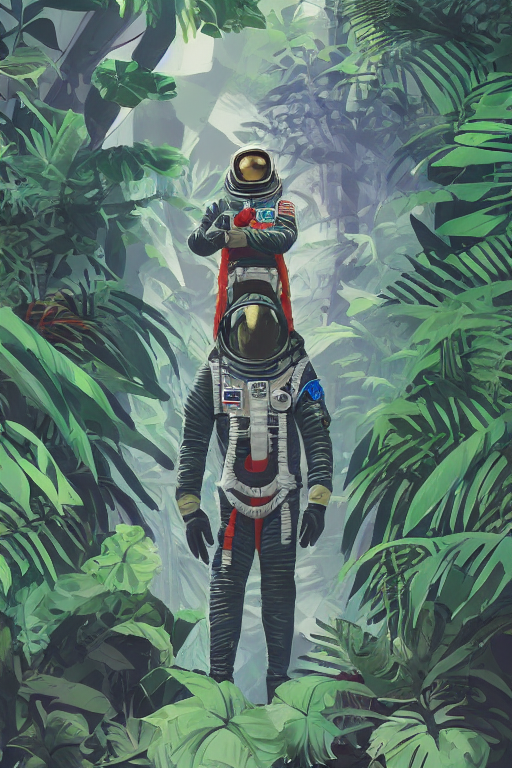

In [14]:
from diffusers import AutoPipelineForText2Image
import torch

pipeline = AutoPipelineForText2Image.from_pretrained(
	"stable-diffusion-v1-5/stable-diffusion-v1-5", torch_dtype=torch.float16, variant="fp16"
).to("cuda")
image = pipeline(
	"Astronaut in a jungle, cold color palette, muted colors, detailed, 8k", height=768, width=512
).images[0]
image

<div class="flex justify-center">
	<img class="rounded-xl" src="https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/text2img-hw.png"/>
</div>

<Tip warning={true}>

Other models may have different default image sizes depending on the image sizes in the training dataset. For example, SDXL's default image size is 1024x1024 and using lower `height` and `width` values may result in lower quality images. Make sure you check the model's API reference first!

</Tip>

### Guidance scale

The `guidance_scale` parameter affects how much the prompt influences image generation. A lower value gives the model "creativity" to generate images that are more loosely related to the prompt. Higher `guidance_scale` values push the model to follow the prompt more closely, and if this value is too high, you may observe some artifacts in the generated image.

In [ ]:
import gc
import torch

# Delete the old pipeline object
del pipeline
gc.collect()

# Clear CUDA memory
torch.cuda.empty_cache()

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

config.json: 0.00B [00:00, ?B/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

text_encoder/model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

safety_checker/model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

unet/diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

vae/diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`torch_dtype` is deprecated! Use `dtype` instead!


  0%|          | 0/50 [00:00<?, ?it/s]

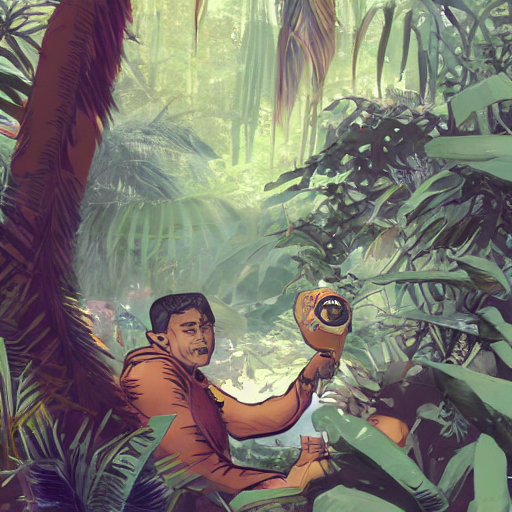

In [1]:
from diffusers import AutoPipelineForText2Image
import torch

pipeline = AutoPipelineForText2Image.from_pretrained(
	"stable-diffusion-v1-5/stable-diffusion-v1-5", torch_dtype=torch.float16
).to("cuda")
image = pipeline(
	"Astronaut in a jungle, cold color palette, muted colors, detailed, 8k", guidance_scale=3.5
).images[0]
image

  0%|          | 0/50 [00:00<?, ?it/s]

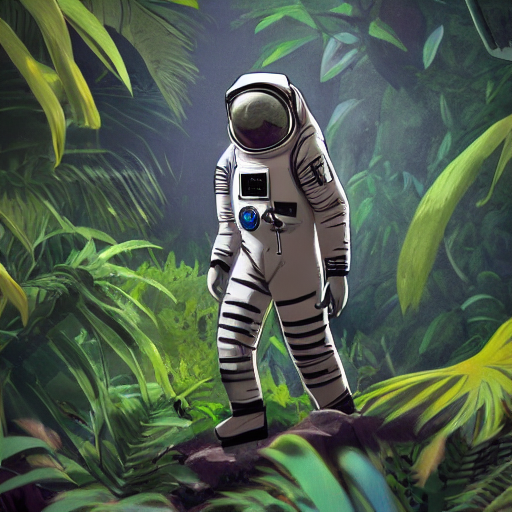

In [2]:
image = pipeline(
	"Astronaut in a jungle, cold color palette, muted colors, detailed, 8k", guidance_scale=7.5
).images[0]
image

<div class="flex flex-row gap-4">
  <div class="flex-1">
    <img class="rounded-xl" src="https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/text2img-guidance-scale-2.5.png"/>
    <figcaption class="mt-2 text-center text-sm text-gray-500">guidance_scale = 2.5</figcaption>
  </div>
  <div class="flex-1">
    <img class="rounded-xl" src="https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/text2img-guidance-scale-7.5.png"/>
    <figcaption class="mt-2 text-center text-sm text-gray-500">guidance_scale = 7.5</figcaption>
  </div>
  <div class="flex-1">
    <img class="rounded-xl" src="https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/text2img-guidance-scale-10.5.png"/>
    <figcaption class="mt-2 text-center text-sm text-gray-500">guidance_scale = 10.5</figcaption>
  </div>
</div>

### Negative prompt

Just like how a prompt guides generation, a *negative prompt* steers the model away from things you don't want the model to generate. This is commonly used to improve overall image quality by removing poor or bad image features such as "low resolution" or "bad details". You can also use a negative prompt to remove or modify the content and style of an image.

In [3]:
import gc
import torch

# Delete the old pipeline object
del pipeline
gc.collect()

# Clear CUDA memory
torch.cuda.empty_cache()

In [4]:
from diffusers import AutoPipelineForText2Image
import torch

pipeline = AutoPipelineForText2Image.from_pretrained(
	"stable-diffusion-v1-5/stable-diffusion-v1-5", torch_dtype=torch.float16
).to("cuda")

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

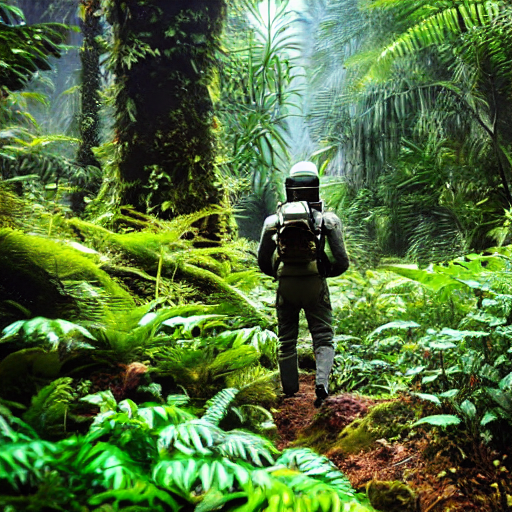

In [5]:
image = pipeline(
	prompt="Astronaut in a jungle, cold color palette, muted colors, detailed, 8k",
	negative_prompt="ugly, deformed, disfigured, poor details, bad anatomy",
).images[0]
image

<div class="flex flex-row gap-4">
  <div class="flex-1">
    <img class="rounded-xl" src="https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/text2img-neg-prompt-1.png"/>
    <figcaption class="mt-2 text-center text-sm text-gray-500">negative_prompt = "ugly, deformed, disfigured, poor details, bad anatomy"</figcaption>
  </div>
  <div class="flex-1">
    <img class="rounded-xl" src="https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/text2img-neg-prompt-2.png"/>
    <figcaption class="mt-2 text-center text-sm text-gray-500">negative_prompt = "astronaut"</figcaption>
  </div>
</div>

### Generator

A [`torch.Generator`](https://pytorch.org/docs/stable/generated/torch.Generator.html#generator) object enables reproducibility in a pipeline by setting a manual seed. You can use a `Generator` to generate batches of images and iteratively improve on an image generated from a seed as detailed in the [Improve image quality with deterministic generation](https://huggingface.co/docs/diffusers/main/en/using-diffusers/reusing_seeds) guide.

You can set a seed and `Generator` as shown below. Creating an image with a `Generator` should return the same result each time instead of randomly generating a new image.

In [6]:
import gc
import torch

# Delete the old pipeline object
del pipeline
gc.collect()

# Clear CUDA memory
torch.cuda.empty_cache()

In [7]:
from diffusers import AutoPipelineForText2Image
import torch

pipeline = AutoPipelineForText2Image.from_pretrained(
	"stable-diffusion-v1-5/stable-diffusion-v1-5", torch_dtype=torch.float16
).to("cuda")


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

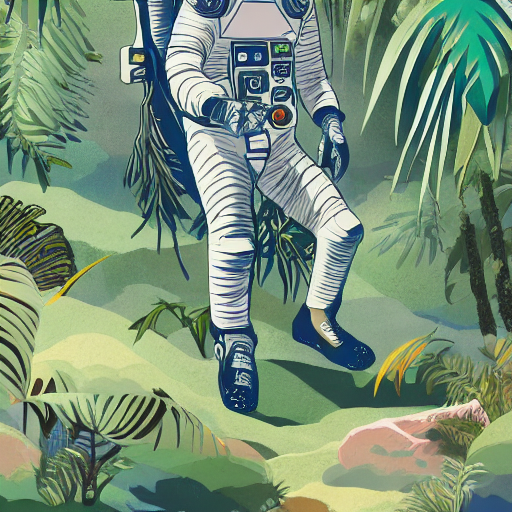

In [8]:
generator = torch.Generator(device="cuda").manual_seed(30)
image = pipeline(
	"Astronaut in a jungle, cold color palette, muted colors, detailed, 8k",
	generator=generator,
).images[0]
image

# Inpainting

Inpainting replaces or edits specific areas of an image. This makes it a useful tool for image restoration like removing defects and artifacts, or even replacing an image area with something entirely new. Inpainting relies on a mask to determine which regions of an image to fill in; the area to inpaint is represented by white pixels and the area to keep is represented by black pixels. The white pixels are filled in by the prompt.

With 🤗 Diffusers, here is how you can do inpainting:

1. Load an inpainting checkpoint with the [AutoPipelineForInpainting](https://huggingface.co/docs/diffusers/main/en/api/pipelines/auto_pipeline#diffusers.AutoPipelineForInpainting) class. This'll automatically detect the appropriate pipeline class to load based on the checkpoint:

In [1]:
import gc
import torch

# Delete the old pipeline object
del pipeline
gc.collect()

# Clear CUDA memory
torch.cuda.empty_cache()

NameError: name 'pipeline' is not defined

In [1]:
import torch
from diffusers import AutoPipelineForInpainting
from diffusers.utils import load_image, make_image_grid

pipeline = AutoPipelineForInpainting.from_pretrained(
    "kandinsky-community/kandinsky-2-2-decoder-inpaint", torch_dtype=torch.float16
)

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


Loading pipeline components...:   0%|          | 0/3 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

`torch_dtype` is deprecated! Use `dtype` instead!


In [2]:
pipeline.enable_model_cpu_offload()
# remove following line if xFormers is not installed or you have PyTorch 2.0 or higher installed
# pipeline.enable_xformers_memory_efficient_attention()

<Tip>

You'll notice throughout the guide, we use [enable_model_cpu_offload()](https://huggingface.co/docs/diffusers/main/en/api/pipelines/overview#diffusers.DiffusionPipeline.enable_model_cpu_offload) and [enable_xformers_memory_efficient_attention()](https://huggingface.co/docs/diffusers/main/en/api/pipelines/overview#diffusers.DiffusionPipeline.enable_xformers_memory_efficient_attention), to save memory and increase inference speed. If you're using PyTorch 2.0, it's not necessary to call [enable_xformers_memory_efficient_attention()](https://huggingface.co/docs/diffusers/main/en/api/pipelines/overview#diffusers.DiffusionPipeline.enable_xformers_memory_efficient_attention) on your pipeline because it'll already be using PyTorch 2.0's native [scaled-dot product attention](https://huggingface.co/docs/diffusers/main/en/using-diffusers/../optimization/fp16#scaled-dot-product-attention).

</Tip>

2. Load the base and mask images:

In [3]:
init_image = load_image("https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/inpaint.png")
mask_image = load_image("https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/inpaint_mask.png")

3. Create a prompt to inpaint the image with and pass it to the pipeline with the base and mask images:

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

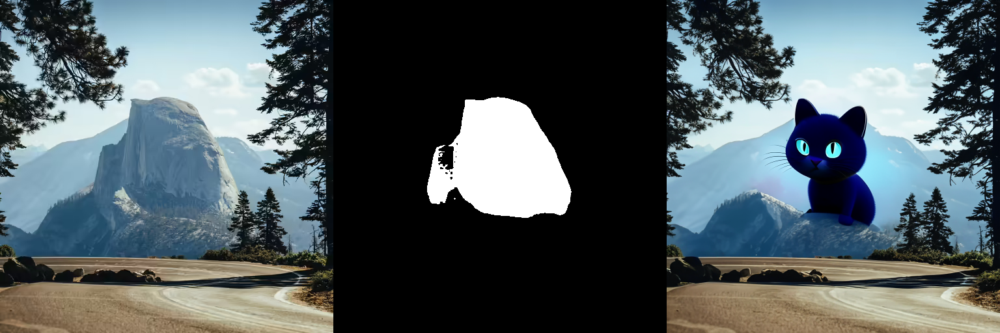

In [4]:
prompt = "a black cat with glowing eyes, cute, adorable, disney, pixar, highly detailed, 8k"
negative_prompt = "bad anatomy, deformed, ugly, disfigured"
image = pipeline(prompt=prompt, negative_prompt=negative_prompt, image=init_image, mask_image=mask_image).images[0]
make_image_grid([init_image, mask_image, image], rows=1, cols=3)

## Create a mask image

Throughout this guide, the mask image is provided in all of the code examples for convenience. You can inpaint on your own images, but you'll need to create a mask image for it. Use the Space below to easily create a mask image.

Upload a base image to inpaint on and use the sketch tool to draw a mask. Once you're done, click **Run** to generate and download the mask image.

<iframe
  src="https://stevhliu-inpaint-mask-maker.hf.space"
  frameborder="0"
  width="850"
  height="450"
></iframe>

### Mask blur

The `~VaeImageProcessor.blur` method provides an option for how to blend the original image and inpaint area. The amount of blur is determined by the `blur_factor` parameter. Increasing the `blur_factor` increases the amount of blur applied to the mask edges, softening the transition between the original image and inpaint area. A low or zero `blur_factor` preserves the sharper edges of the mask.

To use this, create a blurred mask with the image processor.

model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

text_encoder/model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

safety_checker/model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

vae/diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

unet/diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

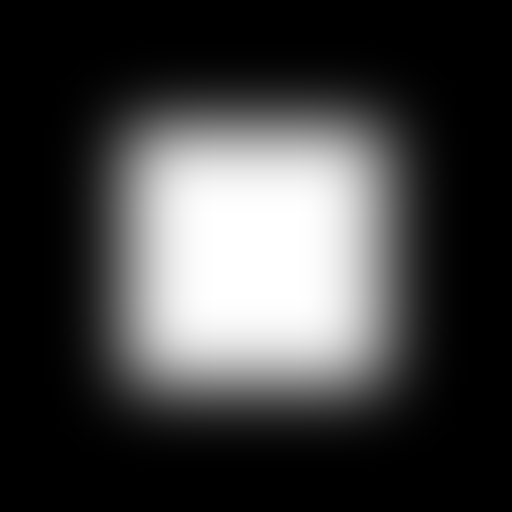

In [5]:
import torch
from diffusers import AutoPipelineForInpainting
from diffusers.utils import load_image
from PIL import Image

pipeline = AutoPipelineForInpainting.from_pretrained("stable-diffusion-v1-5/stable-diffusion-v1-5", torch_dtype=torch.float16).to('cuda')

mask = load_image("https://huggingface.co/datasets/YiYiXu/testing-images/resolve/main/seashore_mask.png")
blurred_mask = pipeline.mask_processor.blur(mask, blur_factor=33)
blurred_mask

## Popular models

[Stable Diffusion Inpainting](https://huggingface.co/runwayml/stable-diffusion-inpainting), [Stable Diffusion XL (SDXL) Inpainting](https://huggingface.co/diffusers/stable-diffusion-xl-1.0-inpainting-0.1), and [Kandinsky 2.2 Inpainting](https://huggingface.co/kandinsky-community/kandinsky-2-2-decoder-inpaint) are among the most popular models for inpainting. SDXL typically produces higher resolution images than Stable Diffusion v1.5, and Kandinsky 2.2 is also capable of generating high-quality images.

### Stable Diffusion Inpainting

Stable Diffusion Inpainting is a latent diffusion model finetuned on 512x512 images on inpainting. It is a good starting point because it is relatively fast and generates good quality images. To use this model for inpainting, you'll need to pass a prompt, base and mask image to the pipeline:

In [7]:
import torch
from diffusers import AutoPipelineForInpainting
from diffusers.utils import load_image, make_image_grid

pipeline = AutoPipelineForInpainting.from_pretrained(
    "runwayml/stable-diffusion-inpainting", torch_dtype=torch.float16, variant="fp16"
)

Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [8]:
pipeline.enable_model_cpu_offload()
# remove following line if xFormers is not installed or you have PyTorch 2.0 or higher installed
#pipeline.enable_xformers_memory_efficient_attention()

  0%|          | 0/50 [00:00<?, ?it/s]

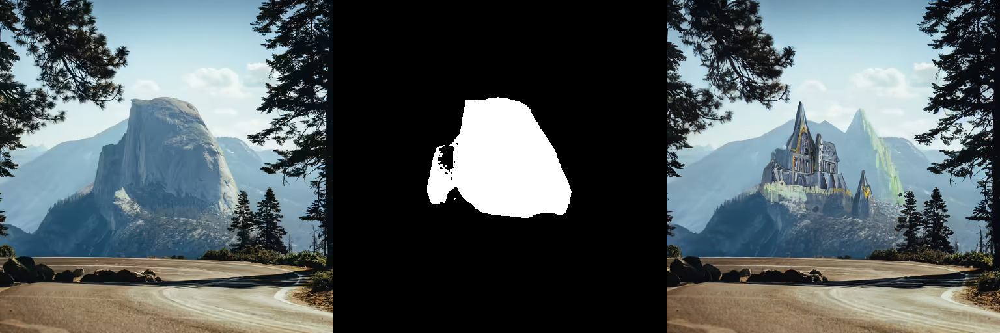

In [9]:
# load base and mask image
init_image = load_image("https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/inpaint.png")
mask_image = load_image("https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/inpaint_mask.png")

generator = torch.Generator("cuda").manual_seed(92)
prompt = "concept art digital painting of an elven castle, inspired by lord of the rings, highly detailed, 8k"
image = pipeline(prompt=prompt, image=init_image, mask_image=mask_image, generator=generator).images[0]
make_image_grid([init_image, mask_image, image], rows=1, cols=3)

In [11]:
import gc
import torch # Delete the old pipeline object
del pipeline
gc.collect() # Clear CUDA memory
torch.cuda.empty_cache()

NameError: name 'pipeline' is not defined

### Stable Diffusion XL (SDXL) Inpainting

SDXL is a larger and more powerful version of Stable Diffusion v1.5. This model can follow a two-stage model process (though each model can also be used alone); the base model generates an image, and a refiner model takes that image and further enhances its details and quality. Take a look at the [SDXL](https://huggingface.co/docs/diffusers/main/en/using-diffusers/sdxl) guide for a more comprehensive guide on how to use SDXL and configure it's parameters.

In [13]:
import torch
from diffusers import AutoPipelineForInpainting
from diffusers.utils import load_image, make_image_grid

pipeline = AutoPipelineForInpainting.from_pretrained(
    "diffusers/stable-diffusion-xl-1.0-inpainting-0.1", torch_dtype=torch.float16, variant="fp16"
)

model_index.json:   0%|          | 0.00/690 [00:00<?, ?B/s]

Fetching 18 files:   0%|          | 0/18 [00:00<?, ?it/s]

config.json:   0%|          | 0.00/758 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/746 [00:00<?, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

text_encoder/model.fp16.safetensors:   0%|          | 0.00/246M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/737 [00:00<?, ?B/s]

text_encoder_2/model.fp16.safetensors:   0%|          | 0.00/1.39G [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/479 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

tokenizer_config.json:   0%|          | 0.00/725 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

unet/diffusion_pytorch_model.fp16.safete(…):   0%|          | 0.00/5.14G [00:00<?, ?B/s]

config.json:   0%|          | 0.00/659 [00:00<?, ?B/s]

vae/diffusion_pytorch_model.fp16.safeten(…):   0%|          | 0.00/167M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

The config attributes {'decay': 0.9999, 'inv_gamma': 1.0, 'min_decay': 0.0, 'optimization_step': 37000, 'power': 0.6666666666666666, 'update_after_step': 0, 'use_ema_warmup': False} were passed to UNet2DConditionModel, but are not expected and will be ignored. Please verify your config.json configuration file.


  0%|          | 0/49 [00:00<?, ?it/s]

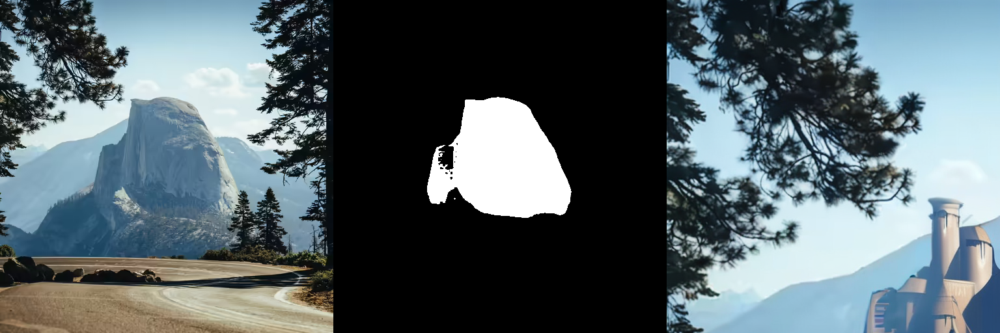

In [14]:
pipeline.enable_model_cpu_offload()
# remove following line if xFormers is not installed or you have PyTorch 2.0 or higher installed
#pipeline.enable_xformers_memory_efficient_attention()

# load base and mask image
init_image = load_image("https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/inpaint.png")
mask_image = load_image("https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/inpaint_mask.png")

generator = torch.Generator("cuda").manual_seed(92)
prompt = "concept art digital painting of an elven castle, inspired by lord of the rings, highly detailed, 8k"
image = pipeline(prompt=prompt, image=init_image, mask_image=mask_image, generator=generator).images[0]
make_image_grid([init_image, mask_image, image], rows=1, cols=3)

### Kandinsky 2.2 Inpainting

The Kandinsky model family is similar to SDXL because it uses two models as well; the image prior model creates image embeddings, and the diffusion model generates images from them. You can load the image prior and diffusion model separately, but the easiest way to use Kandinsky 2.2 is to load it into the [AutoPipelineForInpainting](https://huggingface.co/docs/diffusers/main/en/api/pipelines/auto_pipeline#diffusers.AutoPipelineForInpainting) class which uses the [KandinskyV22InpaintCombinedPipeline](https://huggingface.co/docs/diffusers/main/en/api/pipelines/kandinsky_v22#diffusers.KandinskyV22InpaintCombinedPipeline) under the hood.

In [1]:
import torch
from diffusers import AutoPipelineForInpainting
from diffusers.utils import load_image, make_image_grid

pipeline = AutoPipelineForInpainting.from_pretrained(
    "kandinsky-community/kandinsky-2-2-decoder-inpaint", torch_dtype=torch.float16
)


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/257 [00:00<?, ?B/s]

Fetching 7 files:   0%|          | 0/7 [00:00<?, ?it/s]

config.json:   0%|          | 0.00/660 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

movq/diffusion_pytorch_model.safetensors:   0%|          | 0.00/271M [00:00<?, ?B/s]

README.md: 0.00B [00:00, ?B/s]

unet/diffusion_pytorch_model.safetensors:   0%|          | 0.00/5.01G [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/318 [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/3 [00:00<?, ?it/s]

model_index.json:   0%|          | 0.00/501 [00:00<?, ?B/s]

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

config.json: 0.00B [00:00, ?B/s]

preprocessor_config.json:   0%|          | 0.00/315 [00:00<?, ?B/s]

prior/diffusion_pytorch_model.safetensor(…):   0%|          | 0.00/4.10G [00:00<?, ?B/s]

config.json:   0%|          | 0.00/252 [00:00<?, ?B/s]

image_encoder/model.safetensors:   0%|          | 0.00/3.69G [00:00<?, ?B/s]

text_encoder/model.safetensors:   0%|          | 0.00/2.78G [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

scheduler_config.json:   0%|          | 0.00/229 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer_config.json:   0%|          | 0.00/904 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

`torch_dtype` is deprecated! Use `dtype` instead!


In [3]:
pipeline.enable_model_cpu_offload()
# remove following line if xFormers is not installed or you have PyTorch 2.0 or higher installed
#pipeline.enable_xformers_memory_efficient_attention()

# load base and mask image
init_image = load_image("https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/inpaint.png")
mask_image = load_image("https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/inpaint_mask.png")

generator = torch.Generator("cuda").manual_seed(92)
prompt = "concept art digital painting of an elven castle, inspired by lord of the rings, highly detailed, 8k"
image = pipeline(prompt=prompt, image=init_image, mask_image=mask_image, generator=generator).images[0]
make_image_grid([init_image, mask_image, image], rows=1, cols=3)

RuntimeError: `enable_model_cpu_offload` requires accelerator, but not found

## Non-inpaint specific checkpoints

So far, this guide has used inpaint specific checkpoints such as [stable-diffusion-v1-5/stable-diffusion-inpainting](https://huggingface.co/stable-diffusion-v1-5/stable-diffusion-inpainting). But you can also use regular checkpoints like [stable-diffusion-v1-5/stable-diffusion-v1-5](https://huggingface.co/stable-diffusion-v1-5/stable-diffusion-v1-5). Let's compare the results of the two checkpoints.

The image on the left is generated from a regular checkpoint, and the image on the right is from an inpaint checkpoint. You'll immediately notice the image on the left is not as clean, and you can still see the outline of the area the model is supposed to inpaint. The image on the right is much cleaner and the inpainted area appears more natural.

<hfoptions id="regular-specific">
<hfoption id="stable-diffusion-v1-5/stable-diffusion-v1-5">

In [ ]:
import torch
from diffusers import AutoPipelineForInpainting
from diffusers.utils import load_image, make_image_grid

pipeline = AutoPipelineForInpainting.from_pretrained(
    "stable-diffusion-v1-5/stable-diffusion-v1-5", torch_dtype=torch.float16, variant="fp16"
)


In [ ]:
pipeline.enable_model_cpu_offload()
# remove following line if xFormers is not installed or you have PyTorch 2.0 or higher installed
#pipeline.enable_xformers_memory_efficient_attention()

# load base and mask image
init_image = load_image("https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/inpaint.png")
mask_image = load_image("https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/inpaint_mask.png")

generator = torch.Generator("cuda").manual_seed(92)
prompt = "concept art digital painting of an elven castle, inspired by lord of the rings, highly detailed, 8k"
image = pipeline(prompt=prompt, image=init_image, mask_image=mask_image, generator=generator).images[0]
make_image_grid([init_image, image], rows=1, cols=2)

In [ ]:
import torch
from diffusers import AutoPipelineForInpainting
from diffusers.utils import load_image, make_image_grid

pipeline = AutoPipelineForInpainting.from_pretrained(
    "runwayml/stable-diffusion-inpainting", torch_dtype=torch.float16, variant="fp16"
)


In [ ]:
pipeline.enable_model_cpu_offload()
# remove following line if xFormers is not installed or you have PyTorch 2.0 or higher installed
#pipeline.enable_xformers_memory_efficient_attention()

# load base and mask image
init_image = load_image("https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/inpaint.png")
mask_image = load_image("https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/inpaint_mask.png")

generator = torch.Generator("cuda").manual_seed(92)
prompt = "concept art digital painting of an elven castle, inspired by lord of the rings, highly detailed, 8k"
image = pipeline(prompt=prompt, image=init_image, mask_image=mask_image, generator=generator).images[0]
make_image_grid([init_image, image], rows=1, cols=2)

In [ ]:
import torch
from diffusers import AutoPipelineForInpainting
from diffusers.utils import load_image, make_image_grid

pipeline = AutoPipelineForInpainting.from_pretrained(
    "stable-diffusion-v1-5/stable-diffusion-v1-5", torch_dtype=torch.float16, variant="fp16"
)


In [ ]:
pipeline.enable_model_cpu_offload()
# remove following line if xFormers is not installed or you have PyTorch 2.0 or higher installed
# pipeline.enable_xformers_memory_efficient_attention()

# load base and mask image
init_image = load_image("https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/inpaint.png")
mask_image = load_image("https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/road-mask.png")

image = pipeline(prompt="road", image=init_image, mask_image=mask_image).images[0]
make_image_grid([init_image, image], rows=1, cols=2)

In [ ]:
import torch
from diffusers import AutoPipelineForInpainting
from diffusers.utils import load_image, make_image_grid

pipeline = AutoPipelineForInpainting.from_pretrained(
    "runwayml/stable-diffusion-inpainting", torch_dtype=torch.float16, variant="fp16"
)

In [ ]:
pipeline.enable_model_cpu_offload()
# remove following line if xFormers is not installed or you have PyTorch 2.0 or higher installed
#pipeline.enable_xformers_memory_efficient_attention()

# load base and mask image
init_image = load_image("https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/inpaint.png")
mask_image = load_image("https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/road-mask.png")

image = pipeline(prompt="road", image=init_image, mask_image=mask_image).images[0]
make_image_grid([init_image, image], rows=1, cols=2)

In [ ]:
import PIL
import numpy as np
import torch

from diffusers import AutoPipelineForInpainting
from diffusers.utils import load_image, make_image_grid

device = "cuda"
pipeline = AutoPipelineForInpainting.from_pretrained(
    "runwayml/stable-diffusion-inpainting",
    torch_dtype=torch.float16,
    variant="fp16"
)


In [ ]:
pipeline = pipeline.to(device)

img_url = "https://raw.githubusercontent.com/CompVis/latent-diffusion/main/data/inpainting_examples/overture-creations-5sI6fQgYIuo.png"
mask_url = "https://raw.githubusercontent.com/CompVis/latent-diffusion/main/data/inpainting_examples/overture-creations-5sI6fQgYIuo_mask.png"

init_image = load_image(img_url).resize((512, 512))
mask_image = load_image(mask_url).resize((512, 512))

prompt = "Face of a yellow cat, high resolution, sitting on a park bench"
repainted_image = pipeline(prompt=prompt, image=init_image, mask_image=mask_image).images[0]
repainted_image.save("repainted_image.png")

unmasked_unchanged_image = pipeline.image_processor.apply_overlay(mask_image, init_image, repainted_image)
unmasked_unchanged_image.save("force_unmasked_unchanged.png")
make_image_grid([init_image, mask_image, repainted_image, unmasked_unchanged_image], rows=2, cols=2)

## Configure pipeline parameters

Image features - like quality and "creativity" - are dependent on pipeline parameters. Knowing what these parameters do is important for getting the results you want. Let's take a look at the most important parameters and see how changing them affects the output.

### Strength

`strength` is a measure of how much noise is added to the base image, which influences how similar the output is to the base image.

* 📈 a high `strength` value means more noise is added to an image and the denoising process takes longer, but you'll get higher quality images that are more different from the base image
* 📉 a low `strength` value means less noise is added to an image and the denoising process is faster, but the image quality may not be as great and the generated image resembles the base image more

In [ ]:
import torch
from diffusers import AutoPipelineForInpainting
from diffusers.utils import load_image, make_image_grid

pipeline = AutoPipelineForInpainting.from_pretrained(
    "runwayml/stable-diffusion-inpainting", torch_dtype=torch.float16, variant="fp16"
)
pipeline.enable_model_cpu_offload()
# remove following line if xFormers is not installed or you have PyTorch 2.0 or higher installed
pipeline.enable_xformers_memory_efficient_attention()

# load base and mask image
init_image = load_image("https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/inpaint.png")
mask_image = load_image("https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/inpaint_mask.png")

prompt = "concept art digital painting of an elven castle, inspired by lord of the rings, highly detailed, 8k"
image = pipeline(prompt=prompt, image=init_image, mask_image=mask_image, strength=0.6).images[0]
make_image_grid([init_image, mask_image, image], rows=1, cols=3)

### Guidance scale

`guidance_scale` affects how aligned the text prompt and generated image are.

* 📈 a high `guidance_scale` value means the prompt and generated image are closely aligned, so the output is a stricter interpretation of the prompt
* 📉 a low `guidance_scale` value means the prompt and generated image are more loosely aligned, so the output may be more varied from the prompt

You can use `strength` and `guidance_scale` together for more control over how expressive the model is. For example, a combination high `strength` and `guidance_scale` values gives the model the most creative freedom.

In [ ]:
import torch
from diffusers import AutoPipelineForInpainting
from diffusers.utils import load_image, make_image_grid

pipeline = AutoPipelineForInpainting.from_pretrained(
    "runwayml/stable-diffusion-inpainting", torch_dtype=torch.float16, variant="fp16"
)
pipeline.enable_model_cpu_offload()
# remove following line if xFormers is not installed or you have PyTorch 2.0 or higher installed
pipeline.enable_xformers_memory_efficient_attention()

# load base and mask image
init_image = load_image("https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/inpaint.png")
mask_image = load_image("https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/inpaint_mask.png")

prompt = "concept art digital painting of an elven castle, inspired by lord of the rings, highly detailed, 8k"
image = pipeline(prompt=prompt, image=init_image, mask_image=mask_image, guidance_scale=2.5).images[0]
make_image_grid([init_image, mask_image, image], rows=1, cols=3)

### Negative prompt

A negative prompt assumes the opposite role of a prompt; it guides the model away from generating certain things in an image. This is useful for quickly improving image quality and preventing the model from generating things you don't want.

In [ ]:
import torch
from diffusers import AutoPipelineForInpainting
from diffusers.utils import load_image, make_image_grid

pipeline = AutoPipelineForInpainting.from_pretrained(
    "runwayml/stable-diffusion-inpainting", torch_dtype=torch.float16, variant="fp16"
)
pipeline.enable_model_cpu_offload()
# remove following line if xFormers is not installed or you have PyTorch 2.0 or higher installed
pipeline.enable_xformers_memory_efficient_attention()

# load base and mask image
init_image = load_image("https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/inpaint.png")
mask_image = load_image("https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/inpaint_mask.png")

prompt = "concept art digital painting of an elven castle, inspired by lord of the rings, highly detailed, 8k"
negative_prompt = "bad architecture, unstable, poor details, blurry"
image = pipeline(prompt=prompt, negative_prompt=negative_prompt, image=init_image, mask_image=mask_image).images[0]
make_image_grid([init_image, mask_image, image], rows=1, cols=3)

### Padding mask crop

A method for increasing the inpainting image quality is to use the [`padding_mask_crop`](https://huggingface.co/docs/diffusers/v0.25.0/en/api/pipelines/stable_diffusion/inpaint#diffusers.StableDiffusionInpaintPipeline.__call__.padding_mask_crop) parameter. When enabled, this option crops the masked area with some user-specified padding and it'll also crop the same area from the original image. Both the image and mask are upscaled to a higher resolution for inpainting, and then overlaid on the original image. This is a quick and easy way to improve image quality without using a separate pipeline like [StableDiffusionUpscalePipeline](https://huggingface.co/docs/diffusers/main/en/api/pipelines/stable_diffusion/upscale#diffusers.StableDiffusionUpscalePipeline).

Add the `padding_mask_crop` parameter to the pipeline call and set it to the desired padding value.

In [ ]:
import torch
from diffusers import AutoPipelineForInpainting
from diffusers.utils import load_image
from PIL import Image

generator = torch.Generator(device='cuda').manual_seed(0)
pipeline = AutoPipelineForInpainting.from_pretrained("stable-diffusion-v1-5/stable-diffusion-v1-5", torch_dtype=torch.float16).to('cuda')

base = load_image("https://huggingface.co/datasets/YiYiXu/testing-images/resolve/main/seashore.png")
mask = load_image("https://huggingface.co/datasets/YiYiXu/testing-images/resolve/main/seashore_mask.png")

image = pipeline("boat", image=base, mask_image=mask, strength=0.75, generator=generator, padding_mask_crop=32).images[0]
image

For more tips on how to optimize your code to save memory and speed up inference, read the [Accelerate inference](https://huggingface.co/docs/diffusers/main/en/using-diffusers/../optimization/fp16) and [Reduce memory usage](https://huggingface.co/docs/diffusers/main/en/using-diffusers/../optimization/memory) guides.

## Chained inpainting pipelines

[AutoPipelineForInpainting](https://huggingface.co/docs/diffusers/main/en/api/pipelines/auto_pipeline#diffusers.AutoPipelineForInpainting) can be chained with other 🤗 Diffusers pipelines to edit their outputs. This is often useful for improving the output quality from your other diffusion pipelines, and if you're using multiple pipelines, it can be more memory-efficient to chain them together to keep the outputs in latent space and reuse the same pipeline components.

### Text-to-image-to-inpaint

Chaining a text-to-image and inpainting pipeline allows you to inpaint the generated image, and you don't have to provide a base image to begin with. This makes it convenient to edit your favorite text-to-image outputs without having to generate an entirely new image.

Start with the text-to-image pipeline to create a castle:

In [ ]:
import torch
from diffusers import AutoPipelineForText2Image, AutoPipelineForInpainting
from diffusers.utils import load_image, make_image_grid

pipeline = AutoPipelineForText2Image.from_pretrained(
    "stable-diffusion-v1-5/stable-diffusion-v1-5", torch_dtype=torch.float16, variant="fp16", use_safetensors=True
)
pipeline.enable_model_cpu_offload()
# remove following line if xFormers is not installed or you have PyTorch 2.0 or higher installed
pipeline.enable_xformers_memory_efficient_attention()

text2image = pipeline("concept art digital painting of an elven castle, inspired by lord of the rings, highly detailed, 8k").images[0]

Load the mask image of the output from above:

In [ ]:
mask_image = load_image("https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/inpaint_text-chain-mask.png")

And let's inpaint the masked area with a waterfall:

In [ ]:
pipeline = AutoPipelineForInpainting.from_pretrained(
    "kandinsky-community/kandinsky-2-2-decoder-inpaint", torch_dtype=torch.float16
)
pipeline.enable_model_cpu_offload()
# remove following line if xFormers is not installed or you have PyTorch 2.0 or higher installed
pipeline.enable_xformers_memory_efficient_attention()

prompt = "digital painting of a fantasy waterfall, cloudy"
image = pipeline(prompt=prompt, image=text2image, mask_image=mask_image).images[0]
make_image_grid([text2image, mask_image, image], rows=1, cols=3)

### Inpaint-to-image-to-image

You can also chain an inpainting pipeline before another pipeline like image-to-image or an upscaler to improve the quality.

Begin by inpainting an image:

In [ ]:
import torch
from diffusers import AutoPipelineForInpainting, AutoPipelineForImage2Image
from diffusers.utils import load_image, make_image_grid

pipeline = AutoPipelineForInpainting.from_pretrained(
    "runwayml/stable-diffusion-inpainting", torch_dtype=torch.float16, variant="fp16"
)
pipeline.enable_model_cpu_offload()
# remove following line if xFormers is not installed or you have PyTorch 2.0 or higher installed
pipeline.enable_xformers_memory_efficient_attention()

# load base and mask image
init_image = load_image("https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/inpaint.png")
mask_image = load_image("https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/inpaint_mask.png")

prompt = "concept art digital painting of an elven castle, inspired by lord of the rings, highly detailed, 8k"
image_inpainting = pipeline(prompt=prompt, image=init_image, mask_image=mask_image).images[0]

# resize image to 1024x1024 for SDXL
image_inpainting = image_inpainting.resize((1024, 1024))

Now let's pass the image to another inpainting pipeline with SDXL's refiner model to enhance the image details and quality:

In [ ]:
pipeline = AutoPipelineForInpainting.from_pretrained(
    "stabilityai/stable-diffusion-xl-refiner-1.0", torch_dtype=torch.float16, variant="fp16"
)
pipeline.enable_model_cpu_offload()
# remove following line if xFormers is not installed or you have PyTorch 2.0 or higher installed
pipeline.enable_xformers_memory_efficient_attention()

image = pipeline(prompt=prompt, image=image_inpainting, mask_image=mask_image, output_type="latent").images[0]

<Tip>

It is important to specify `output_type="latent"` in the pipeline to keep all the outputs in latent space to avoid an unnecessary decode-encode step. This only works if the chained pipelines are using the same VAE. For example, in the [Text-to-image-to-inpaint](#text-to-image-to-inpaint) section, Kandinsky 2.2 uses a different VAE class than the Stable Diffusion model so it won't work. But if you use Stable Diffusion v1.5 for both pipelines, then you can keep everything in latent space because they both use [AutoencoderKL](https://huggingface.co/docs/diffusers/main/en/api/models/autoencoderkl#diffusers.AutoencoderKL).

</Tip>

Finally, you can pass this image to an image-to-image pipeline to put the finishing touches on it. It is more efficient to use the [from_pipe()](https://huggingface.co/docs/diffusers/main/en/api/pipelines/auto_pipeline#diffusers.AutoPipelineForImage2Image.from_pipe) method to reuse the existing pipeline components, and avoid unnecessarily loading all the pipeline components into memory again.

In [ ]:
pipeline = AutoPipelineForImage2Image.from_pipe(pipeline)
# remove following line if xFormers is not installed or you have PyTorch 2.0 or higher installed
pipeline.enable_xformers_memory_efficient_attention()

image = pipeline(prompt=prompt, image=image).images[0]
make_image_grid([init_image, mask_image, image_inpainting, image], rows=2, cols=2)